<a href="https://colab.research.google.com/github/mishc9/dle-notebooks/blob/master/final_transfer_learning_example_tf.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Подготовка окружения

In [0]:
%tensorflow_version 2.x

TensorFlow 2.x selected.


In [0]:
!pip install tensorflow-datasets

In [0]:
import tensorflow_datasets as tfds
import tensorflow.keras as keras
import numpy as np
import matplotlib.pyplot as plt
from numpy.linalg import norm
import tensorflow as tf
from sklearn.neighbors import NearestNeighbors
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
print(tf.__version__)

2.1.0


### Загрузка данных
* Загружаем датасет
* Изучаем свойства датасета, получив его описание

In [0]:
tfds.list_builders()

In [0]:
dataset_name = 'cassava'
tfds.load(dataset_name)
_, imagenette_info = tfds.load(dataset_name, with_info=True)
imagenette_info

/usr/local/lib/python3.6/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning: Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  InsecureRequestWarning)


Shuffling and writing examples to /root/tensorflow_datasets/cassava/0.1.0.incompleteWNE77D/cassava-train.tfrecord


Shuffling and writing examples to /root/tensorflow_datasets/cassava/0.1.0.incompleteWNE77D/cassava-test.tfrecord


Shuffling and writing examples to /root/tensorflow_datasets/cassava/0.1.0.incompleteWNE77D/cassava-validation.tfrecord


Dataset cassava downloaded and prepared to /root/tensorflow_datasets/cassava/0.1.0. Subsequent calls will reuse this data.


tfds.core.DatasetInfo(
    name='cassava',
    version=0.1.0,
    description='Cassava consists of leaf images for the cassava plant depicting healthy and
four (4) disease conditions; Cassava Mosaic Disease (CMD), Cassava Bacterial
Blight (CBB), Cassava Greem Mite (CGM) and Cassava Brown Streak Disease (CBSD).
Dataset consists of a total of 9430 labelled images.
The 9430 labelled images are split into a training set (5656), a test set(1885)
and a validation set (1889). The number of images per class are unbalanced with
the two disease classes CMD and CBSD having 72% of the images.
',
    homepage='https://www.kaggle.com/c/cassava-disease/overview',
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=tf.uint8),
        'image/filename': Text(shape=(), dtype=tf.string),
        'label': ClassLabel(shape=(), dtype=tf.int64, num_classes=5),
    }),
    total_num_examples=9430,
    splits={
        'test': 1885,
        'train': 5656,
        'validation': 1889,


## Transfer learning: InceptionResNetV2

> Что из себя представляет InceptionResNetV2? Это "синтез" идей GoogLeNet (inception - блоки) и ResNet (residual connection).

<img src="https://1.bp.blogspot.com/-O7AznVGY9js/V8cV_wKKsMI/AAAAAAAABKQ/maO7n2w3dT4Pkcmk7wgGqiSX5FUW2sfZgCLcB/s1600/image00.png">

### Слои модели

* Загрузим модель с весами imagenet и без слоев классификатора [1]
* Посмотрим на ее последние слои [2]
* Изучим классификатор, подумаем, как добавить свой [3]

Вывод: для уменьшения размерности последнего сверточного слоя нужно добавить GlobalAveragePooling2D, который сократит размерность до количества каналов.

In [0]:
model = keras.applications.InceptionResNetV2(include_top=False, weights='imagenet')  # [1]

219062272/219055592 [==============================] - 14s 0us/step


In [0]:
model.layers[-1]  # [2]

In [0]:
keras.applications.InceptionResNetV2(include_top=True, weights='imagenet').layers[-5:]  # [3]

225214464/225209952 [==============================] - 16s 0us/step


### Utils

> Будем разбирать вспомогательные функции и классы по ходу занятия

In [0]:
def make_model(img_shape, num_classes, model=None):
  """
  Создаем модель. По умолчанию - InceptionResNetV2.
  Если передан конструктор model, используется он (должен поддерживать 
  интерфейс keras.applications).
  
  Из созданного экземпляра модели (в котором нет выходного слоя, т.е. это
  feature extractor) создается модель, которая будет обучаться.

  (Добавляется GlobalAveragePooling2D и два полносвязных слоя с дропаутом).
  """
  if model is None:
    model = keras.applications.InceptionResNetV2(include_top=False, weights='imagenet')
  else:
    model = model(include_top=False, weights='imagenet')
  for layer in model.layers:
    layer.trainable = False
  input = keras.layers.Input(img_shape)
  custom_model = model(input)
  custom_model = keras.layers.GlobalAveragePooling2D()(custom_model)
  custom_model = keras.layers.Dense(64, activation='relu')(custom_model)
  custom_model = keras.layers.Dropout(0.5)(custom_model)
  predictions = keras.layers.Dense(num_classes, activation='softmax')(custom_model)
  return keras.Model(input, predictions)


def prepare_data(data, image_shape):
  """
  Подготовка данных к формату tf.data.Dataset.
 
  data - tf.data.Dataset - обрабатывается: при помощи map применяются
  tf.image.resize до размера image_shape, а затем rescale.
  """
  def resize(x, y):
    return (tf.image.resize(x, image_shape), y)
  
  def rescale(x, y):
    return (tf.cast(x, dtype=tf.float32) / 255., y)  # cast из int во float

  return (data
          .map(resize)
          .map(rescale)
          # .cache()  # - лучше не кешировать в память в колабе.
          .shuffle(1024)  # - рандомизированный порядок загрузки изображений
          )


def make_feature_extractor(model, crop_layers):
  """
  Делаем feature_extractor из модели model, отбрасывая crop_layers слоев.
  """
  inp = model.input
  output = model.layers[-(crop_layers+1)].output
  return keras.Model(inp, output)


def extract(image, model):
  """
  Извлекает признаки из одного изображения image при помощи model. 
  Нормализует и возвращает извлеченный вектор с признаками.
  """
  image = np.expand_dims(image, axis=0)
  features = model.predict(image)
  features = features / norm(features)
  return features


def plot_neighbors(images, indicies, dist, rows, cols):
  """
  # TODO: переделать так, чтобы размер сетки считался автоматически.
  Строит график с несколькими изображениями.
  images - массив изображений.
  indicies - индексы ближайших соседей в images. 
  dist - список расстояний  # TODO: должен быть той же размерности, что и индексы
  rows - количество строк на plt.subplots.
  cols - количество столбцов на plt.subplots.
  """
  images = images[indicies]
  i = 0
  fig, axis = plt.subplots(nrows=rows, ncols=cols, figsize=(12, 12))
  for row in axis:
    for ax in row:
      ax.imshow(images[i])
      ax.set_title(f"Distance: {dist[i]}")
      i += 1
  plt.show()


# Словать с классами imagenette
CLASSES = dict(enumerate(['tench', 'English springer',
                          'cassette player', 'chain saw',
                          'church', 'French horn',
                          'garbage truck', 'gas pump', 
                          'golf ball', 'parachute']))


class SimilaritySearch:
  """
  Класс для поиска похожих изображений при помощи KNN
  """
  def __init__(self, model):
    self.model = model  
    # Остальные атрибуты определяются во время обучения.
    self.neig = None
    self.images = None
    self.trained = False
    self._normalized_vectors = None

  def fit(self, images):
    """
    Передаем модели массив изображений images.
    Модель
    1) Создает из них векторы
    2) Нормализует векторы
    3) Обучает sklearn-класс для поиска ближайших соседей.
    4) Выставляет флаг, что обучена
    """
    self.images = images
    feature_vectors = self.model.predict(images)
    self._normalized_vectors = feature_vectors / np.expand_dims(norm(feature_vectors, axis=1), axis=-1)
    self.neig = (NearestNeighbors(n_neighbors=4,
                                  algorithm='brute',
                                  metric='euclidean').
                 fit(self.normalized_vectors))
    self.trained = True

  def find(self, vector):
    """
    Поиск изображений из массива, на котором обучалась модель,
    векторные представления которых наиболее близки к vector.
    Работает, только если модель обучена.
    """
    if not self.trained:
      raise RuntimeError("Model was not trained yet.")
    dist, indicies = self.neig.kneighbors([vector])
    plot_neighbors(self.images, indicies[0], dist[0], 2, 2)

  def __call__(self, vector):
    """
    Вызов метода find через ()
    """
    return self.find(vector)

  @property
  def normalized_vectors(self):
    return self._normalized_vectors


def make_tsne_plot_from_vectors(vectors, labels=None, figsize=(6, 4.5)):
  """
  Эта функция строит t-SNE и рисует plt.scatterplot.
  Опцилнально plt.scatterplot аннотирован метками labels.
  """
  tsne_results = TSNE(n_components=2,
                      verbose=1,
                      metric='euclidean').fit_transform(vectors) 

  cmap = plt.cm.get_cmap('coolwarm')
  plt.figure(figsize=figsize, dpi=80)
  scatter = plt.scatter(tsne_results[:, 0],
                        tsne_results[:, 1], 
                        c=labels, 
                        cmap=cmap)
  if labels is not None:
    plt.colorbar(scatter)
  plt.show()


def make_pca_then_tsne_plot(vectors, labels=None):
  """
  На основе веторов vectors сначала делаем PCA, затем tsne.
  labels - метки, используемые для аннотации plt.scatterplot.
  """
  # Следующая строчка нужна, чтобы PCA можно было выполнить, когда размерность
  # целевого пространства была задана больше, чем количество векторов.
  # Мы сокращаем ее до количества векторов.
  pca_dimension = min(100, len(vectors))  
  pca = PCA(pca_dimension)
  pca.fit(vectors)
  pca_vectors = pca.transform(vectors)
  make_tsne_plot_from_vectors(pca_vectors, labels)


def plot_pair(im_l, im_r, idx):
  """
  Печатает idx-й элемент из "первого" и "второго" массивов на
  одном плоте как пару изображений.
  """
  fig, axis = plt.subplots(nrows=1, ncols=2)
  axis[0].imshow(im_l[idx])
  axis[1].imshow(im_r[idx])
  plt.show()


def _plot_misclassified(ax, image, true_label, predicted_label):
  """
  Рисует изображение в переданном объекте ax. 
  Добавляет подписи с настоящим и спрогнозированным классом.
  """
  ax.imshow(image)
  ax.set_title(f"TRUE LABEL: {CLASSES[true_label]},\nPREDICTED: {CLASSES[predicted_label]}")


def get_subplots_grid(n_items, max_n_cols):
  """
  Рассчитывает необходимое количество строк и столбцов, 
  исходя из максимального количества столбцов и количества элементов.
  """
  if n_items % max_n_cols == 0:
    n_rows = n_items // max_n_cols
  else:
    n_rows = n_items // max_n_cols + 1
  n_cols = min(n_items, max_n_cols)
  return n_rows, n_cols


def plot_misclassified(misclassified, labels, predictions, max_n_cols = 5):
  """
  Получает список ошибочно классифицированных изображений missclassified,
  список _всех_ меток labels,
  список _всех_ лейблов predicitons.
  Эти при помощи _plot_misclassified строит subplots шириной max_n_cols.
  """
  w, h = 4, 3  # ширина и высота области для одного subplot
  n_misc = len(misclassified)
  if n_misc == 0:
    print("There's nothing to plot!")
  elif n_misc == 1:
    n_rows, n_cols = 1, 1
    fig, axis = plt.subplots(nrows=n_rows, ncols=n_cols,
                            figsize=(w * n_cols, h * n_rows))
    axis.axis('off')
    _plot_misclassified(axis,
                        misclassified[0],
                        labels[labels != predictions][0],
                        predictions[labels != predictions][0])
  else:
    n_rows, n_cols = get_subplots_grid(n_misc, max_n_cols)
    fig, axis = plt.subplots(nrows=n_rows, ncols=n_cols,
                            figsize=(w * n_cols, h * n_rows))
    for i, image in enumerate(misclassified):
      ax = axis[i] if n_rows == 1 else axis[i // n_cols, i % n_cols]
      ax.axis('off')  # отключает подписи осей
      _plot_misclassified(ax,
                          misclassified[i],
                          labels[labels != predictions][i],
                          predictions[labels != predictions][i])    
    plt.show()


def plot_feature_extraction(feature_extractor,
                            images,
                            labels,
                            n_images_to_plot=0):
  """
  Функция для исследования скрытого пространства, которое извлек 
  feature_extractor.
  feature extractor - нейросеть, возвращает вектора из n-мерного пространства
  images - набор изображений, который будет передан в нейросеть
  labels - набор меток (нужен для построения t-SNE)
  n_images_to_plot - количество изображений, для которого будут показаны 
  три ближайших соседа
  """
  # Обучение модели для поиска ближайших соседей
  search = SimilaritySearch(feature_extractor)
  search.fit(images)
  # Получение нормализованного векторного представления происходит внутри
  # SimilaritySearch таким образом:
  # feature_vectors = feature_extractor.predict(images)
  # feature_vectors / np.expand_dims(norm(feature_vectors, axis=1), axis=-1)
  normalized_vecotrs = search.normalized_vectors 

  for image_num in range(n_images_to_plot):
    search(normalized_vecotrs[image_num])

  fs_shape = normalized_vecotrs.shape[-1]
  if fs_shape > 100:  # Если размерность "большая", сначала сделаем PCA 
    make_pca_then_tsne_plot(normalized_vecotrs, labels)
  else:  # Иначе сразу делаем t-SNE
    make_tsne_plot_from_vectors(normalized_vecotrs, labels)
  return feature_extractor

## Training

### Prepare data

Обратите внимание на supervised_keys. Это множество ключей сэмпла, которое используется при обучении с учителем. Поддерживается методом model.fit

In [0]:
imagenette_info.supervised_keys

('image', 'label')

Загрузим данные `as_supervised`. То есть отдельный сэмпл представлен не словарем `{'value': value, 'label': label}`, а кортежем `(value, label)`. Кортежи совместимы с `model.fit` и другими методами.

In [0]:
train_data, test_data = tfds.load(dataset_name, split=['train', 'validation'], as_supervised=True)

In [0]:
test_as_dict, info = tfds.load(dataset_name, split='test', with_info=True)

In [0]:
tfds.show_examples(info, test_as_dict)

Подготовим данные: сделаем resize и rescale.

Больше о подготовке данных в `tf.data` и `tfds` вы можете узнать в первой лекции по transfer learning.

In [0]:
image_shape = (299, 299)
train = prepare_data(train_data, image_shape)
test = prepare_data(test_data, image_shape)

In [0]:
train_data, test_data = tfds.load(dataset_name, split=['train', 'validation'], as_supervised=True)

### Fit model

Сначала создадим и скомпилируем экземпляр модели. Обратите внимание: оптимизатор, метрика, функция ошибки переданы не как строковые ключи, а как объекты. Это позволяет параметризовать их.

In [0]:
imagenette_model = make_model((299, 299, 3), imagenette_info.features['label'].num_classes)
imagenette_model.compile(keras.optimizers.Adam(learning_rate=0.001), 
                         keras.losses.SparseCategoricalCrossentropy(),
                         metrics=[keras.metrics.SparseCategoricalAccuracy()])

Обучим модель.
* Обратите внимание на вызов `batch(batch_size)`. Это нужно для того, чтобы данные передавались в цикл не по одному сэмплу, а минибатчами.
* `prefetch(...)` используется для презагрузки данных на видеокарту - это ускоряет обучение за счет снижения времени простоя карты. Объем подгружаемых данных вычисляется автоматически.
* Необходимо указать количество шагов обучения и валидации, чтобы избежать ошибок `StopIteration` / бесконечных циклов. Не забывайте делать это!

In [0]:
batch_size = 64
EPOCHS=1
imagenette_model.fit(train.batch(batch_size).prefetch(tf.data.experimental.AUTOTUNE),
                     validation_data=test.batch(batch_size),
                     steps_per_epoch=12894 // batch_size,
                     validation_steps=500 // batch_size,
                     epochs=EPOCHS)

Train for 201 steps, validate for 7 steps
201/201 [==============================] - 94s 469ms/step - loss: nan - sparse_categorical_accuracy: 0.1004 - val_loss: nan - val_sparse_categorical_accuracy: 0.0982


## Evaluation

### Predict

* Извлечем данные из датасетов и проклассифицируем их. Найдем те, на которых мы ошиблись.

In [0]:
images, labels = zip(*((i.numpy(), j.numpy()) for i, j in test))
images = np.array(images)
labels = np.array(labels)
predictions = np.argmax(imagenette_model.predict(images), axis=1)

In [0]:
misclassified = images[labels != predictions]

In [0]:
len(misclassified)

1

### Plot misclassified

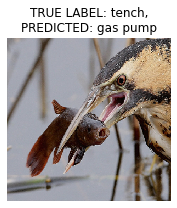

In [0]:
plot_misclassified(misclassified,
                   labels,
                   predictions)

## Similarity search

### Создаем feature extractor

> Найдем тот слой, из которого хотим извлекать признаки, и передадим его в feature extractor

In [0]:
imagenette_model.layers[-6:]

Это `GlobalAveragePooling2D`. Поэтому мы уберем три слоя, идущие до него.

In [0]:
feature_extractor = make_feature_extractor(imagenette_model, 3)

### Extract features

* Извлечем векторы признаков
* Нормализуем их при помощи `np.norm` (длина векторов станет равна 1)
* Этот код, собранный вместе, распределен по разным функциям и классам внутри раздела utils, в том числе SimilaritySearch.

In [0]:
feature_vectors = feature_extractor.predict(images)
normalized_vecotrs = feature_vectors / np.expand_dims(norm(feature_vectors, axis=1), axis=-1)
# Делаем expand_dims, чтобы операция деления "скастовалась"

**Сравнение длины векторов:**

In [0]:
feature_vectors.shape

(500, 1536)

In [0]:
print(norm(feature_vectors[0]))
print(norm(normalized_vecotrs[0]))

9.337501
1.0


### Найдем похожие изображения с помощью NN

> Данный код также можно обнаружить внутри `SimilaritySearch.fit`

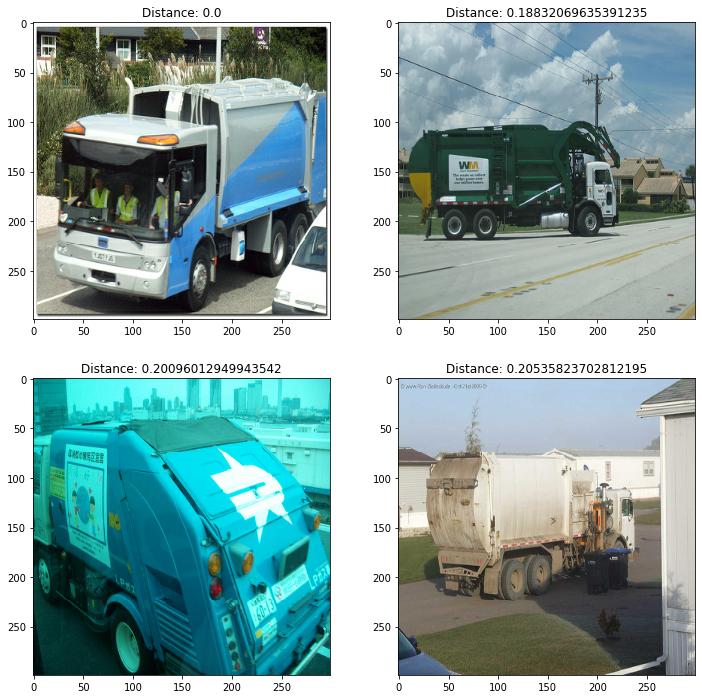

In [0]:
neig = (NearestNeighbors(n_neighbors=4, algorithm='brute', metric='euclidean').
        fit(normalized_vecotrs))
dist, indicies = neig.kneighbors([normalized_vecotrs[0]])
plot_neighbors(images, indicies[0], dist[0], 2, 2)

### Завернем все в один класс: демо

> См. раздел Utils, `class SimilaritySearch`

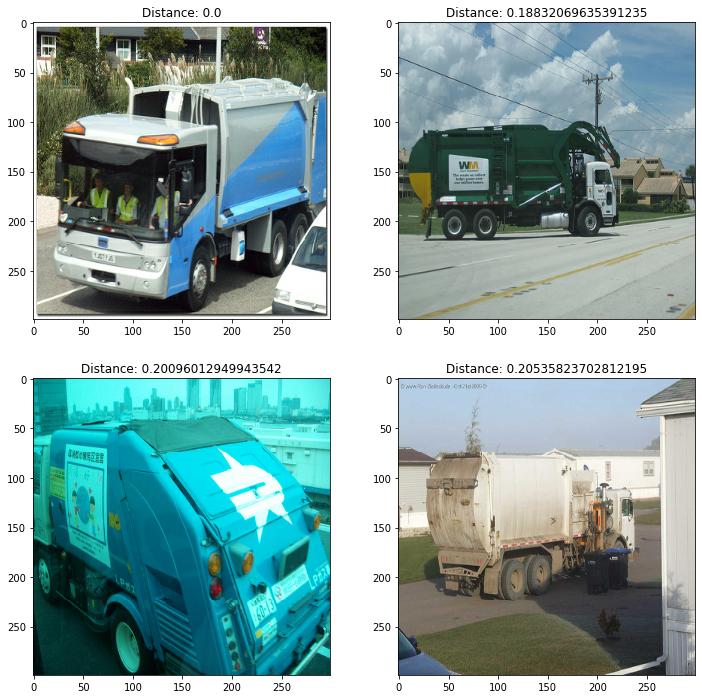

In [0]:
search = SimilaritySearch(feature_extractor)
search.fit(images)
search(normalized_vecotrs[0])

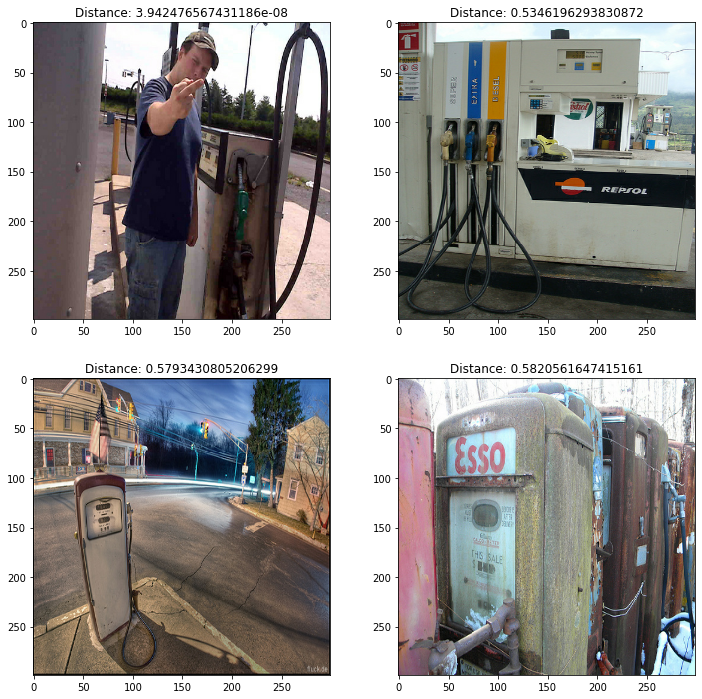

In [0]:
search(normalized_vecotrs[1])

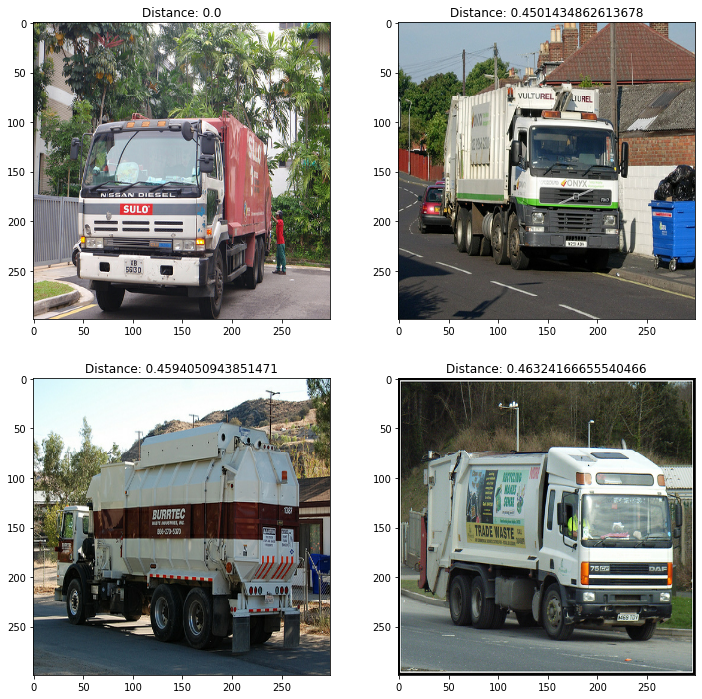

In [0]:
search(normalized_vecotrs[2])

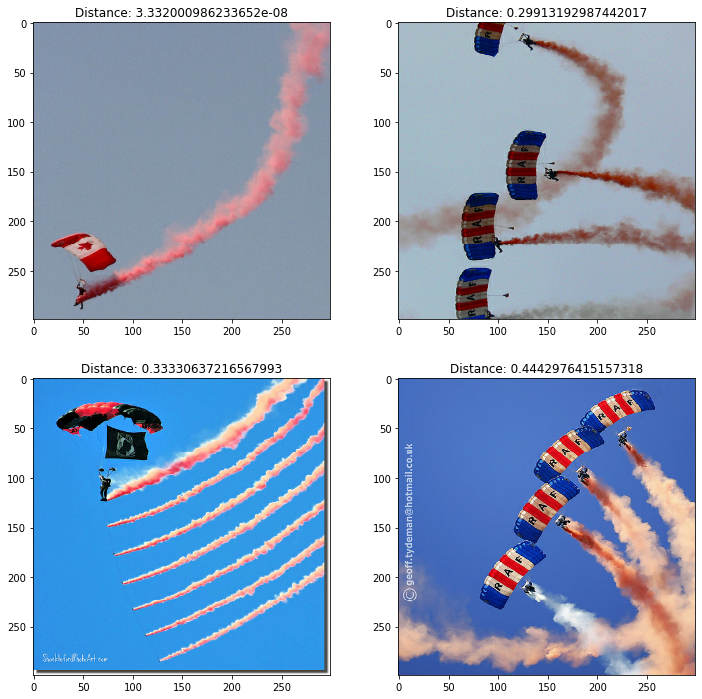

In [0]:
search(normalized_vecotrs[3])

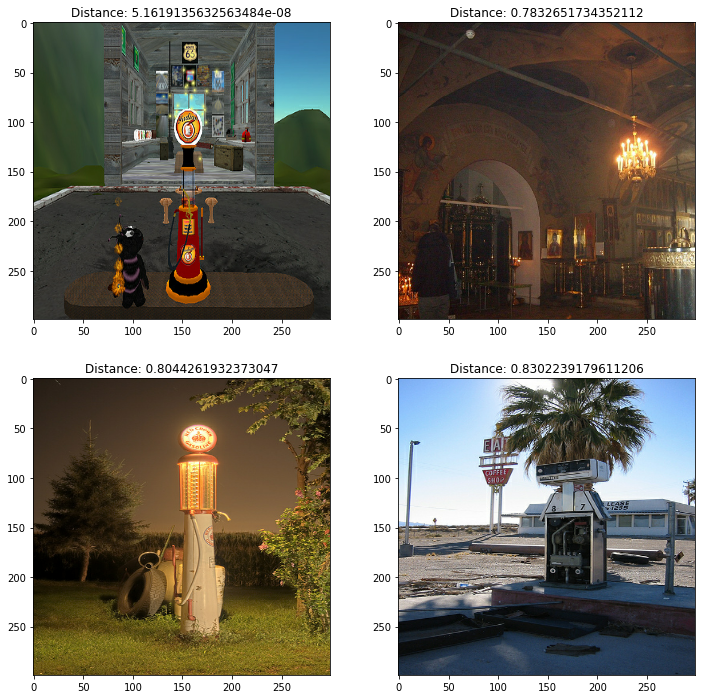

In [0]:
search(normalized_vecotrs[4])

## Vector space

* Давайте разберемся, почему так хорошо разделяются классы
* Насколько это "наша" заслуга, или заслуга transfer learning, а насколько - эффект feature extractor'a

In [0]:
pca_dimension = 100
pca = PCA(pca_dimension)
pca.fit(normalized_vecotrs)
pca_vectors = pca.transform(normalized_vecotrs)

In [0]:
pca_vectors.shape

(500, 100)

In [0]:
tsne_results = TSNE(n_components=2,
                    verbose=1,
                    metric='euclidean').fit_transform(pca_vectors) 

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 500 samples in 0.009s...
[t-SNE] Computed neighbors for 500 samples in 0.058s...
[t-SNE] Computed conditional probabilities for sample 500 / 500
[t-SNE] Mean sigma: 0.232249
[t-SNE] KL divergence after 250 iterations with early exaggeration: 47.574760
[t-SNE] KL divergence after 1000 iterations: 0.187621


### t-SNE clusters of 10 classes

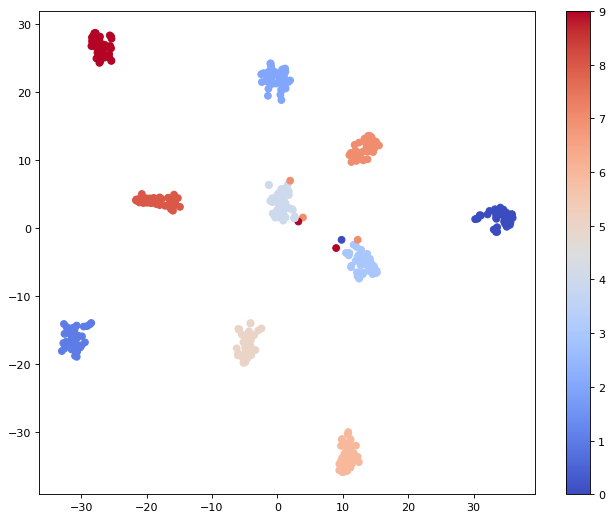

In [0]:
cmap = plt.cm.get_cmap('coolwarm')
plt.figure(figsize=(10, 8), dpi=80)
scatter = plt.scatter(tsne_results[:,0],
                      tsne_results[:,1], 
                      c=labels, 
                      cmap=cmap)
plt.colorbar(scatter)
plt.show()

### Вывод 1: классы хорошо разделимы еще на уровне feature extractor'a

Вывод: это совсем не наша заслуга! Сам по себе feature extractor отлично разделяет классы. Это не удивиьтельно, поскольку 10 классов `imagenette` - _специально отобранные хорошо различимые классы_ из его надмножества, `imagenet`.

Бонус: можно оторбазить вектора прогнозов модели из 10-мерного (вектор вероятностей) в 2-мерное пространство t-SNE и визуализироавть их.


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 500 samples in 0.000s...
[t-SNE] Computed neighbors for 500 samples in 0.015s...
[t-SNE] Computed conditional probabilities for sample 500 / 500
[t-SNE] Mean sigma: 0.000137
[t-SNE] KL divergence after 250 iterations with early exaggeration: 43.569935
[t-SNE] KL divergence after 1000 iterations: 0.045226


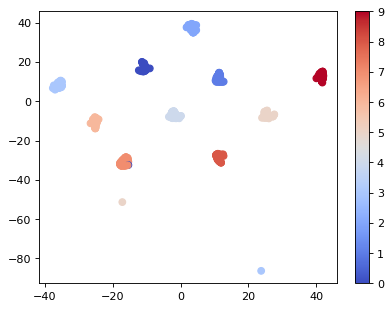

In [0]:
feature_extractor = make_feature_extractor(imagenette_model, 0)
plot_feature_extraction(feature_extractor,
                        images,
                        labels,
                        n_images_to_plot=0
                        )

### Вывод 2: можно изучать распределение, которое создает feature extractor!

## Cat food vs. human food

### Практические возможности transfer learning

* При помощи tranfer learning можно решить почти что угодно
* Например, научиться отличать человеческие консервы от кошачьих

**Для этого мы**:
* Соберем небольшой датасет при помощи fatkun chrome extension
* Загрузим его на GDrive
* Обучим модель при помощи transfer learning
* Посмотрим, что получилось

> Сначала примонтируем свой гугл диск (чтобы было куда загружать датасеты)

In [0]:
from google.colab import drive 
import os

In [0]:
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


Теперь gdrive примонтирован к той вируталке, на которой запущен ваш ноутбук.

In [0]:
!ls /content/gdrive/My\ Drive/Colab\ Notebooks/CatsVsCans

grad_cam  grad_cam.png	model.h5  occlusion.png  test  train


In [0]:
dataset_path = '/content/gdrive/My Drive/Colab Notebooks/CatsVsCans'

In [0]:
os.listdir(dataset_path)

['train', 'test', 'grad_cam', 'occlusion.png', 'grad_cam.png', 'model.h5']

In [0]:
!apt-get install tree

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-430
Use 'apt autoremove' to remove it.
The following NEW packages will be installed:
  tree
0 upgraded, 1 newly installed, 0 to remove and 25 not upgraded.
Need to get 40.7 kB of archives.
After this operation, 105 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tree amd64 1.7.0-5 [40.7 kB]
Fetched 40.7 kB in 1s (33.6 kB/s)
Selecting previously unselected package tree.
(Reading database ... 145113 files and directories currently installed.)
Preparing to unpack .../tree_1.7.0-5_amd64.deb ...
Unpacking tree (1.7.0-5) ...
Setting up tree (1.7.0-5) ...
Processing triggers for man-db (2.8.3-2ubuntu0.1) ...


In [0]:
! rm -r '/content/gdrive/My Drive/Colab Notebooks/CatsVsCans/grad_cam'

In [0]:
!tree '/content/gdrive/My Drive/Colab Notebooks/CatsVsCans' -d 2

/content/gdrive/My Drive/Colab Notebooks/CatsVsCans
├── test
│   ├── cat
│   └── human
└── train
    ├── cat
    └── human
2 [error opening dir]

6 directories


### Вспоминаем flow from directory

> [Туториал](https://keras.io/preprocessing/image/)

* Создадим обучающий и тестовый генераторы. Не забываем дотавить препроцессинг.
* "Запитаем" их из соответвующих директорий.

In [0]:
BATCH_SIZE = 32
IMAGE_SIZE = (299, 299)

train_datagen = keras.preprocessing.image.ImageDataGenerator(
        rescale=1./255,  # в обучающем генераторе используем аугментации
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True)

# В тестовом генераторе аугментации не нужны!
test_datagen = keras.preprocessing.image.ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        os.path.join(dataset_path, 'train'), 
        target_size=IMAGE_SIZE,
        batch_size=BATCH_SIZE,
        class_mode='binary')

test_generator = test_datagen.flow_from_directory(
        os.path.join(dataset_path, 'test'),
        target_size=IMAGE_SIZE,
        batch_size=BATCH_SIZE,
        class_mode='binary')

# generator.n хранит количество предметов в генераторе.
STEPS_PER_EPOCH = train_generator.n // BATCH_SIZE
VALIDATION_STEPS = test_generator.n // BATCH_SIZE

Found 195 images belonging to 2 classes.
Found 85 images belonging to 2 classes.


### Создадим модель

> Код ниже закомментирован: он не нужен, если вы не будете работать с VGG. Я планировал использовать его для демонстрации GradCAM. Но GradCAM (пока) не работает с tl, поэтому код не используется.

In [0]:
# vgg = keras.applications.VGG16(weights='imagenet', 
#                               include_top=True, 
#                               input_tensor=None, 
#                               input_shape=(224, 224, 3), 
#                               pooling=None, 
#                               classes=1000)

In [0]:
# def make_from_vgg(vgg, n_classes=2):
    # """
    # Делаем модель для transfer learning из VGG
    # """
#   inp = vgg.input
#   x = inp
#   for layer in vgg.layers[1:-1]:
#     layer.trainable = False
#     x = layer(x)

#   x = keras.layers.Dense(n_classes, activation='softmax')(x)
#   return keras.Model(inp, x)

In [0]:
# def make_from_vgg_as_sequential(vgg):
    # """
    # Делаем модель для transfer learning из VGG при помощи Sequential
    # """
#   for layer in vgg.layears[1:-1]:
#     layer.trainable = False
#   return keras.Sequential(vgg.layers[1:-1] + [keras.layers.Dense(2, activation='softmax')])

In [0]:
# cvh_model = make_from_vgg(vgg)
# cvh_model = make_from_vgg_as_sequential(vgg)
cvh_model = make_model((299, 299, 3), 2)

In [0]:
cvh_model.compile(keras.optimizers.Adam(),
                  keras.losses.SparseCategoricalCrossentropy(),
                  metrics=[keras.metrics.SparseCategoricalAccuracy()])

### Подготовим картинки для того, чтобы было проще делать демо

In [0]:
def extract_data_from_generator(generator, steps):
  images = list()
  labels = list()
  for (im, l), _ in zip(generator, range(steps)):
    images.append(im)
    labels.append(l)
  return np.concatenate(images), np.concatenate(labels)

In [0]:
images, labels = extract_data_from_generator(test_generator, VALIDATION_STEPS)

**Посмотрим на распределение извлеченных признаков, прежде чем обучать feature extractor**

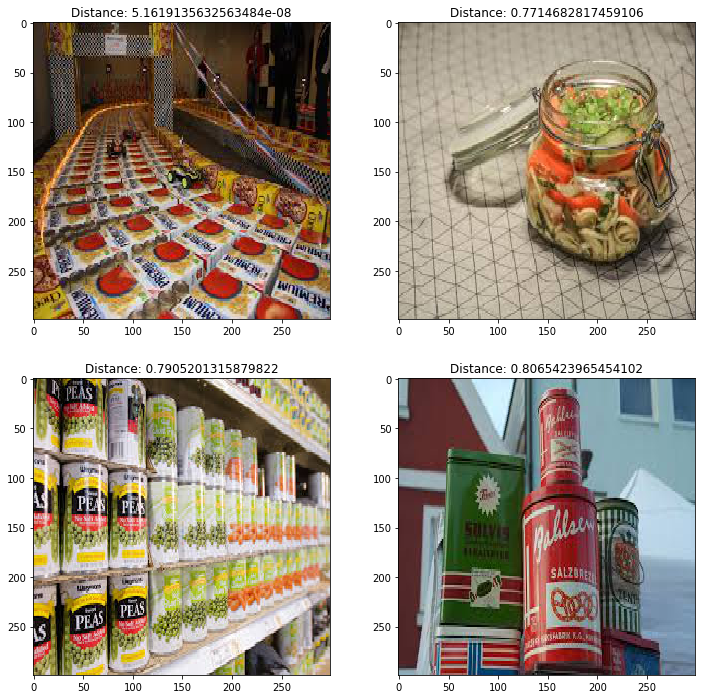

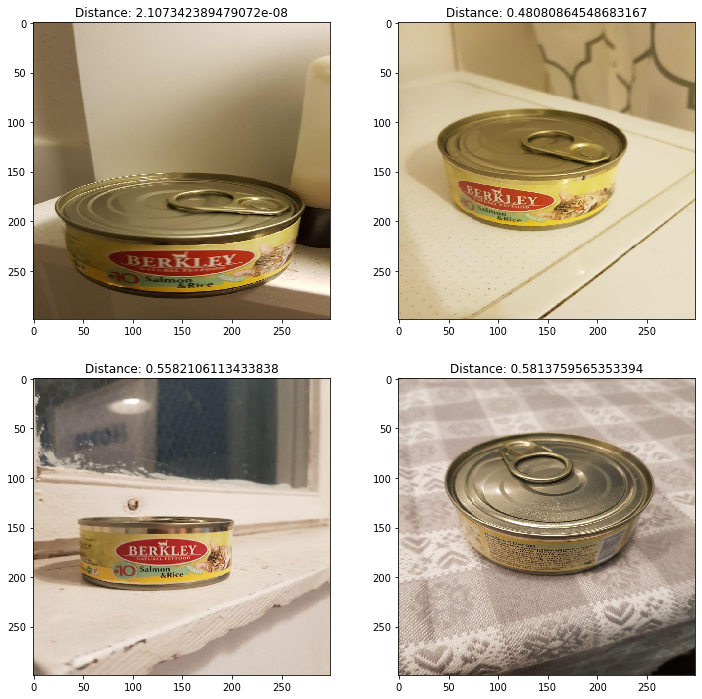

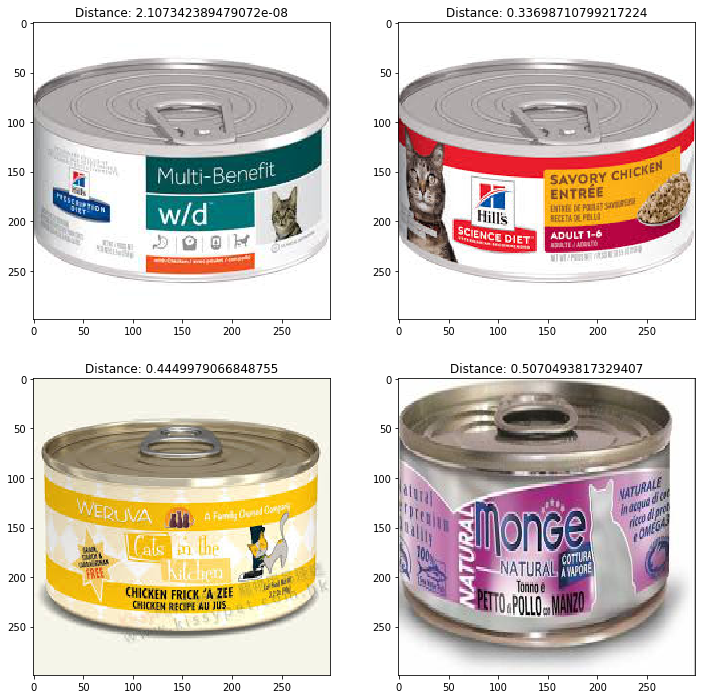

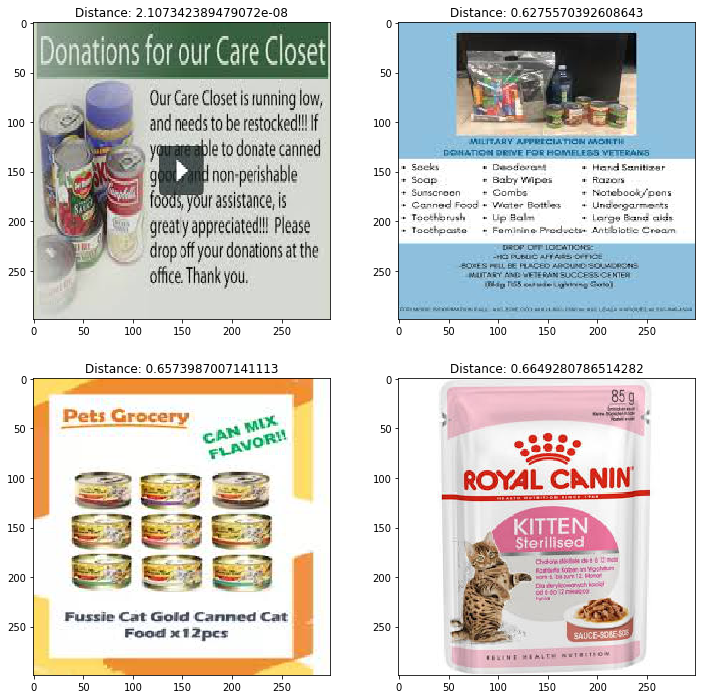

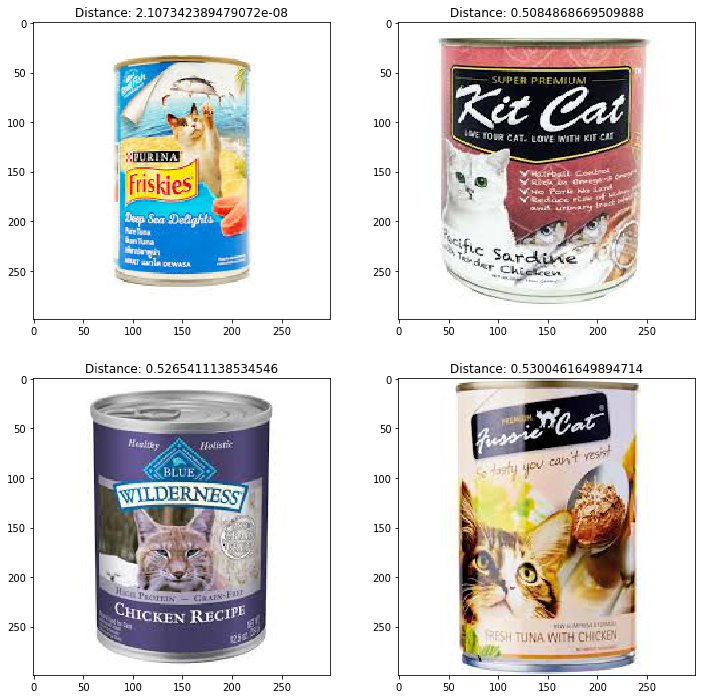

[t-SNE] Computing 63 nearest neighbors...
[t-SNE] Indexed 64 samples in 0.001s...
[t-SNE] Computed neighbors for 64 samples in 0.002s...
[t-SNE] Computed conditional probabilities for sample 64 / 64
[t-SNE] Mean sigma: 0.362375
[t-SNE] KL divergence after 250 iterations with early exaggeration: 51.735046
[t-SNE] KL divergence after 1000 iterations: 0.269436


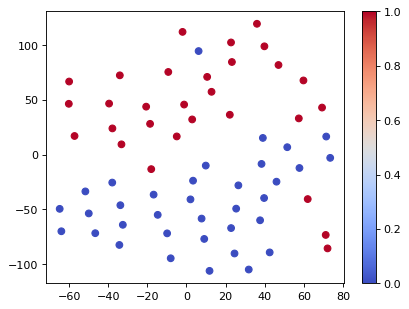

In [0]:
# Закомеентированный feature extractor - для VGG
# feature_extractor = keras.Model(inputs=vgg.input, 
#                                 outputs=vgg.layers[-3].output)
feature_extractor = make_feature_extractor(cvh_model, 3)
plot_feature_extraction(feature_extractor,
                        images,
                        labels,
                        n_images_to_plot=5)

При этом полносвязный слой дает такое представление:

[t-SNE] Computing 63 nearest neighbors...
[t-SNE] Indexed 64 samples in 0.000s...
[t-SNE] Computed neighbors for 64 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 64 / 64
[t-SNE] Mean sigma: 0.247363
[t-SNE] KL divergence after 250 iterations with early exaggeration: 47.461319
[t-SNE] KL divergence after 1000 iterations: 0.369739


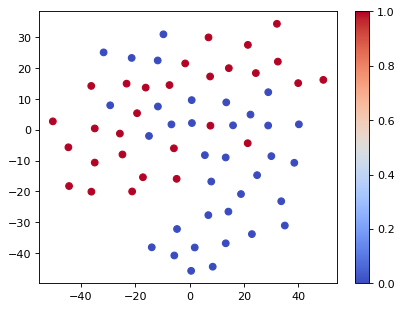

In [0]:
# feature_extractor = keras.Model(inputs=cvh_model.input, 
#                                 outputs=cvh_model.layers[-2].output)
feature_extractor = make_feature_extractor(imagenette_model, 2)
plot_feature_extraction(feature_extractor,
                        images,
                        labels,
                        n_images_to_plot=0
                        )

### Следующая картинка показывает, что нам осталось обучить выходной слой

> Форма сейчас и далее не очень важна, т.к. это t-SNE. Но классы должны не должны "смешиваться" в одной области. 

[t-SNE] Computing 63 nearest neighbors...
[t-SNE] Indexed 64 samples in 0.000s...
[t-SNE] Computed neighbors for 64 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 64 / 64
[t-SNE] Mean sigma: 0.132673
[t-SNE] KL divergence after 250 iterations with early exaggeration: 51.538971
[t-SNE] KL divergence after 1000 iterations: 0.033419


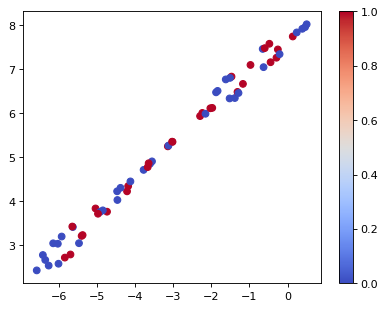

In [0]:
plot_feature_extraction(cvh_model,
                        images,
                        labels,
                        n_images_to_plot=0
                        )

### Обучим модель

> `tf-explain` понадобится позднее.

In [0]:
!pip3 install tf-explain

     |████████████████████████████████| 51kB 2.5MB/s 


In [0]:
from tf_explain.callbacks.grad_cam import GradCAMCallback


monitor = 'val_sparse_categorical_accuracy'
class_index = 0

early_stopping = keras.callbacks.EarlyStopping(monitor=monitor, 
                                               patience=5,
                                               mode='max',
                                               restore_best_weights=True)

checkpoint = keras.callbacks.ModelCheckpoint(os.path.join(dataset_path, 'model.h5'), 
                                             monitor=monitor,
                                             save_best_only=True,
                                             mode='max')


grad_cam_dir = os.path.join(dataset_path, 'grad_cam')
os.makedirs(grad_cam_dir, exist_ok=True)

grad_cam = GradCAMCallback(validation_data=(images, labels),
                           class_index=class_index,
                           layer_name='block5_conv3',
                           output_dir=grad_cam_dir)

callbacks = [early_stopping,
             checkpoint,
             # grad_cam,
             ]

In [0]:
cvh_model.summary()

Model: "model_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         [(None, 299, 299, 3)]     0         
_________________________________________________________________
inception_resnet_v2 (Model)  multiple                  54336736  
_________________________________________________________________
global_average_pooling2d_1 ( (None, 1536)              0         
_________________________________________________________________
dense_2 (Dense)              (None, 64)                98368     
_________________________________________________________________
dropout_1 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense_3 (Dense)              (None, 2)                 130       
Total params: 54,435,234
Trainable params: 98,498
Non-trainable params: 54,336,736
__________________________________________

**Мы рискуем, используя early stopping и не используя потом тестовый датасет.**

Так как можно переобучиться на валидационное (которое сейчас у нас и тестовое же) множество.

In [0]:
cvh_model.fit_generator(train_generator,
                        steps_per_epoch=STEPS_PER_EPOCH,
                        epochs=50,
                        validation_data=test_generator,
                        validation_steps=VALIDATION_STEPS,
                        callbacks=callbacks
                        )

Instructions for updating:
Please use Model.fit, which supports generators.


Instructions for updating:
Please use Model.fit, which supports generators.


  ...
    to  
  ['...']


  ...
    to  
  ['...']


  ...
    to  
  ['...']


  ...
    to  
  ['...']


Train for 6 steps, validate for 2 steps
Epoch 1/50
6/6 [==============================] - 136s 23s/step - loss: 0.6882 - sparse_categorical_accuracy: 0.7362 - val_loss: 1.0032 - val_sparse_categorical_accuracy: 0.4531
Epoch 2/50
6/6 [==============================] - 8s 1s/step - loss: 0.4795 - sparse_categorical_accuracy: 0.7914 - val_loss: 0.6166 - val_sparse_categorical_accuracy: 0.6250
Epoch 3/50
6/6 [==============================] - 4s 645ms/step - loss: 0.3934 - sparse_categorical_accuracy: 0.8160 - val_loss: 0.7035 - val_sparse_categorical_accuracy: 0.5938
Epoch 4/50
6/6 [==============================] - 6s 1s/step - loss: 0.3350 - sparse_categorical_accuracy: 0.8405 - val_loss: 0.4677 - val_sparse_categorical_accuracy: 0.7812
Epoch 5/50
6/6 [==============================] - 7s 1s/step - loss: 0.3252 - sparse_categorical_accuracy: 0.8906 - val_loss: 0.3518 - val_sparse_categorical_accuracy: 0.8438
Epoch 6/50
6/6 [==============================] - 4s 664ms/step - loss: 0.2546 

### Посмотрим на прогнозы последнего слоя

> Разделение стало гораздо лучше

[t-SNE] Computing 63 nearest neighbors...
[t-SNE] Indexed 64 samples in 0.000s...
[t-SNE] Computed neighbors for 64 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 64 / 64
[t-SNE] Mean sigma: 0.204438
[t-SNE] KL divergence after 250 iterations with early exaggeration: 50.798077
[t-SNE] KL divergence after 1000 iterations: 0.295445


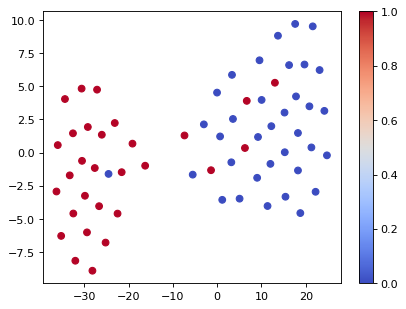

In [0]:
plot_feature_extraction(cvh_model,
                        images,
                        labels,
                        n_images_to_plot=0
                        )

**Если мы обучали больше одно слоя, посмотрим и на промежуточный полносвязный тоже**

> Если обучали только 1, это не имеет смысла. Поскольку веса не изменились.

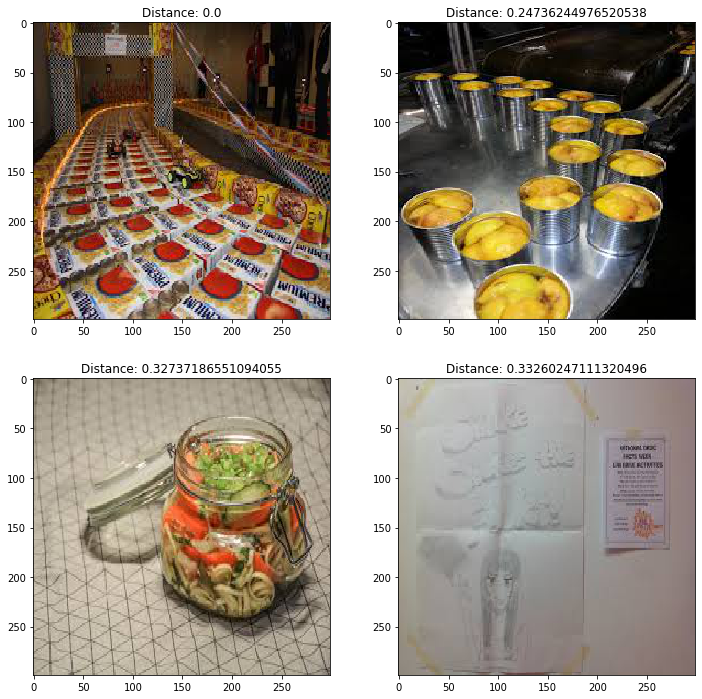

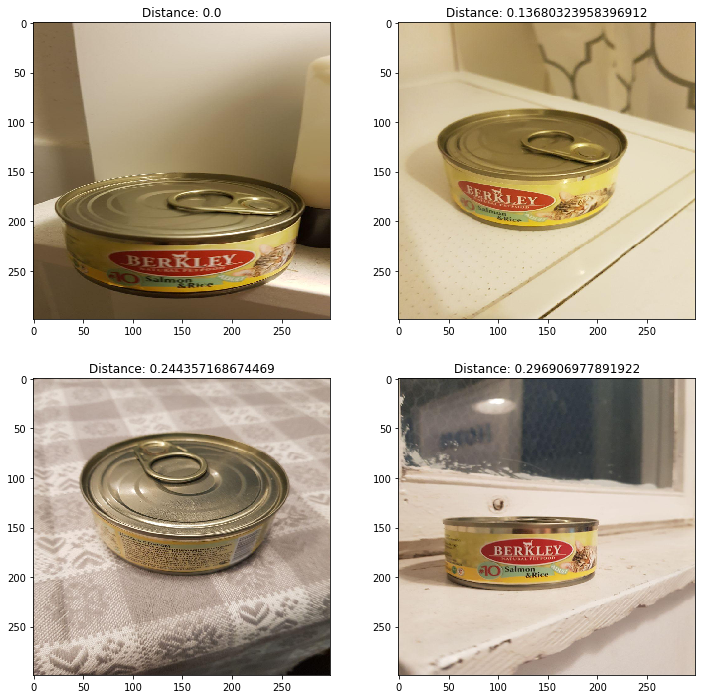

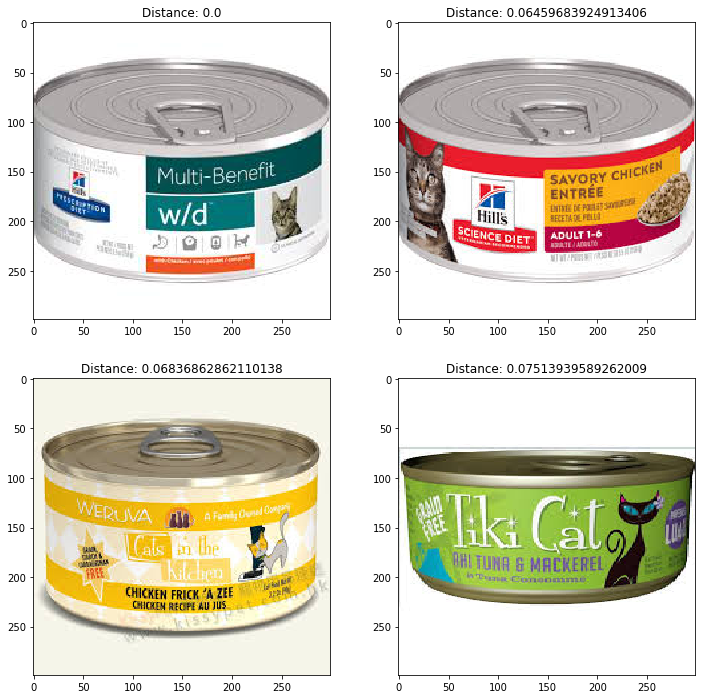

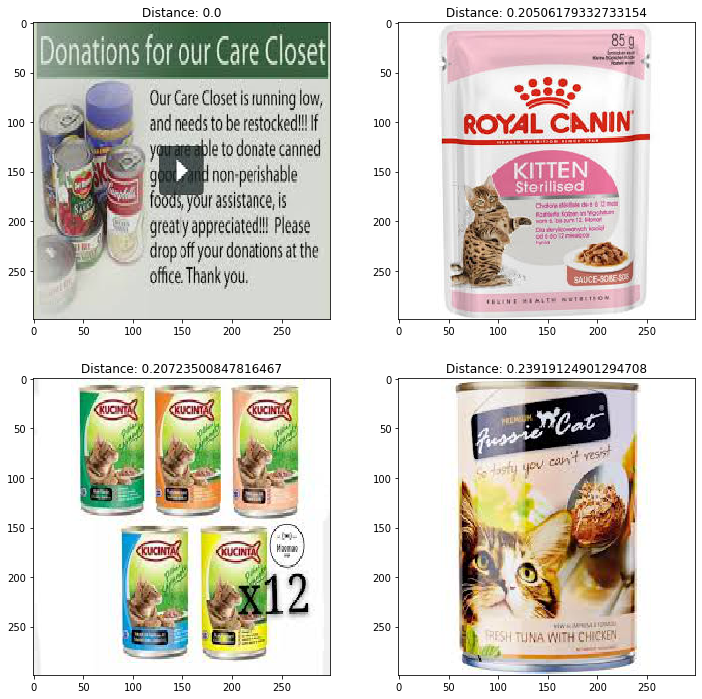

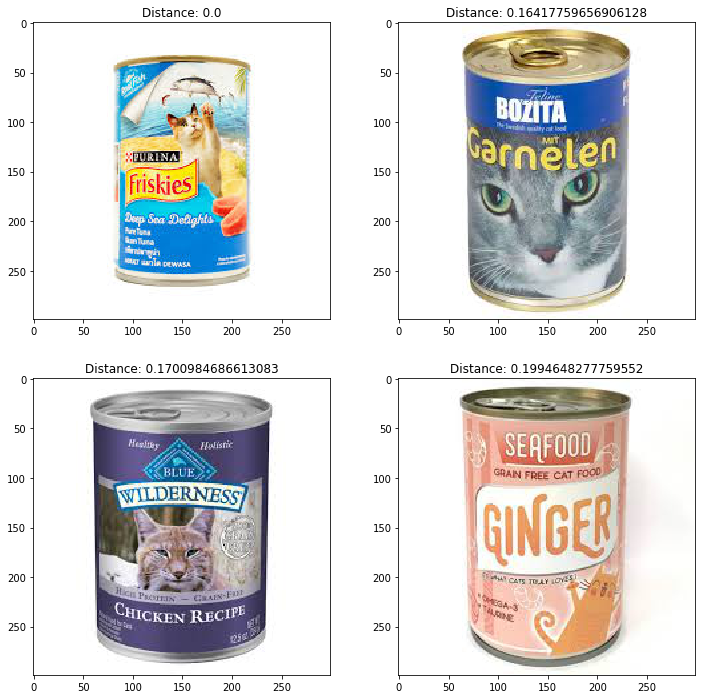

[t-SNE] Computing 63 nearest neighbors...
[t-SNE] Indexed 64 samples in 0.000s...
[t-SNE] Computed neighbors for 64 samples in 0.002s...
[t-SNE] Computed conditional probabilities for sample 64 / 64
[t-SNE] Mean sigma: 0.283983
[t-SNE] KL divergence after 250 iterations with early exaggeration: 49.841972
[t-SNE] KL divergence after 1000 iterations: 0.438404


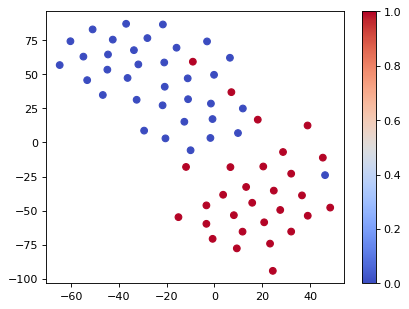

In [0]:
# feature_extractor = keras.Model(cvh_model.input, cvh_model.layers[-2].output)
feature_extractor = make_feature_extractor(cvh_model, 2)
plot_feature_extraction(feature_extractor,
                        images,
                        labels,
                        n_images_to_plot=5
                        )

**Можно ли найти по полученным векторам промежуточного слоя похожие картинки?**

> Это тоже осмысленно, только если мы обучали "промежуточный" полносвязный слой. Но, честно говоря, нейронная сеть с этим справляется по умолчанию так себе. В случае, если вам это нужно, лучше наклаывать дополнительную регуляризацию или использовать metric learning.

## На что нейронная сеть "смотрит"?

> tf-explain содержит в себе несколько методов интерпретации обучения сети. GradCAM позволяет выделить, какие именно участки изображения наиболее сильно указывают на заданный класс. Для каждого из способов интерпретации реализованы отдельные классы и коллбэки, которые можно добавлять в `fit`.

###  Grad CAM

Paper: [Grad-CAM: Visual Explanations from Deep Networks
            via Gradient-based Localization](https://arxiv.org/abs/1610.02391)

In [0]:
from tf_explain.core.grad_cam import GradCAM
from tf_explain.core.occlusion_sensitivity import OcclusionSensitivity
from PIL import Image

IMAGE_PATH = os.path.join(dataset_path, 'test/human/photo_2020-03-02_22-57-06.jpg')

model = tf.keras.applications.vgg16.VGG16(weights="imagenet", include_top=True)

img = tf.keras.preprocessing.image.load_img(IMAGE_PATH, target_size=(224, 224))
img = tf.keras.preprocessing.image.img_to_array(img)

# model.summary()
data = ([img], None)

tabby_cat_class_index = 281
explainer = GradCAM()
# Compute GradCAM on VGG16
grid = explainer.explain(
    data, model, class_index=tabby_cat_class_index, layer_name="block5_conv3"
)
explainer.save(grid, dataset_path, "grad_cam.png")

553467904/553467096 [==============================] - 34s 0us/step


In [0]:
img =  Image.open(os.path.join(dataset_path, "grad_cam.png"), )

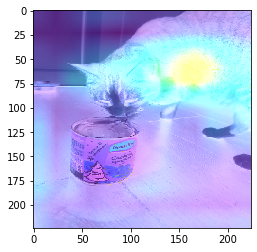

In [0]:
plt.imshow(img)
plt.show()

### Occlusion

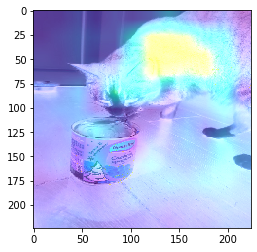

In [0]:
explainer = OcclusionSensitivity()
grid = explainer.explain(data, model, tabby_cat_class_index, 20)
explainer.save(grid, dataset_path, "occlusion.png")
img =  Image.open(os.path.join(dataset_path, "occlusion.png"), )
plt.imshow(img)
plt.show()